# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [2]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [3]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

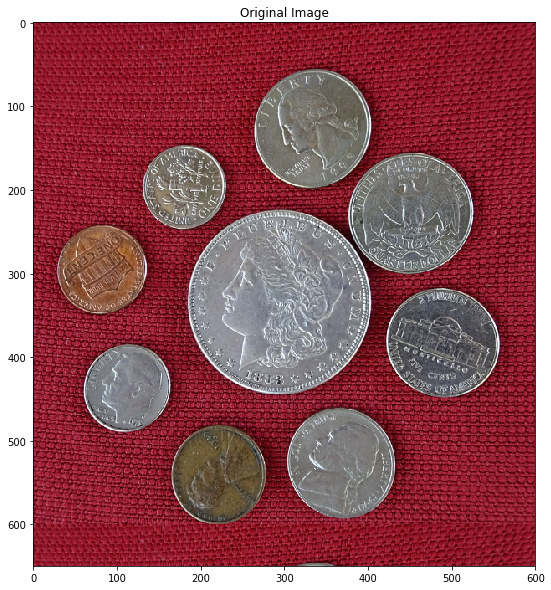

In [3]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
###
image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
###
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert image to grayscale
# Store it in the variable imageGray
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
###


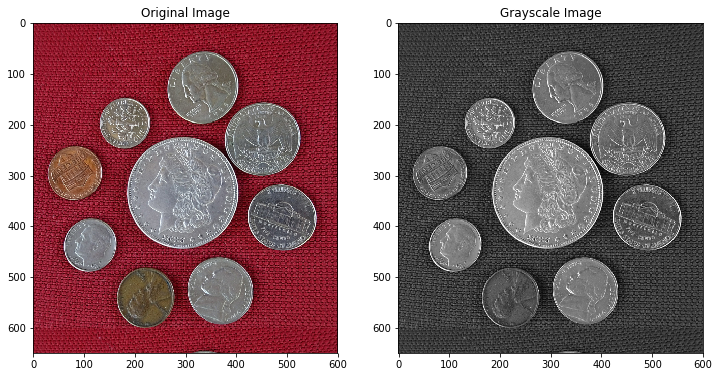

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
###
imageB, imageG, imageR = image[:,:,0], image[:,:,1], image[:,:,2]
###


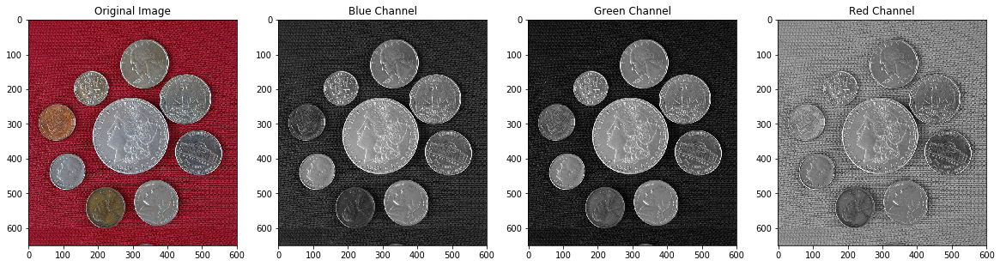

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

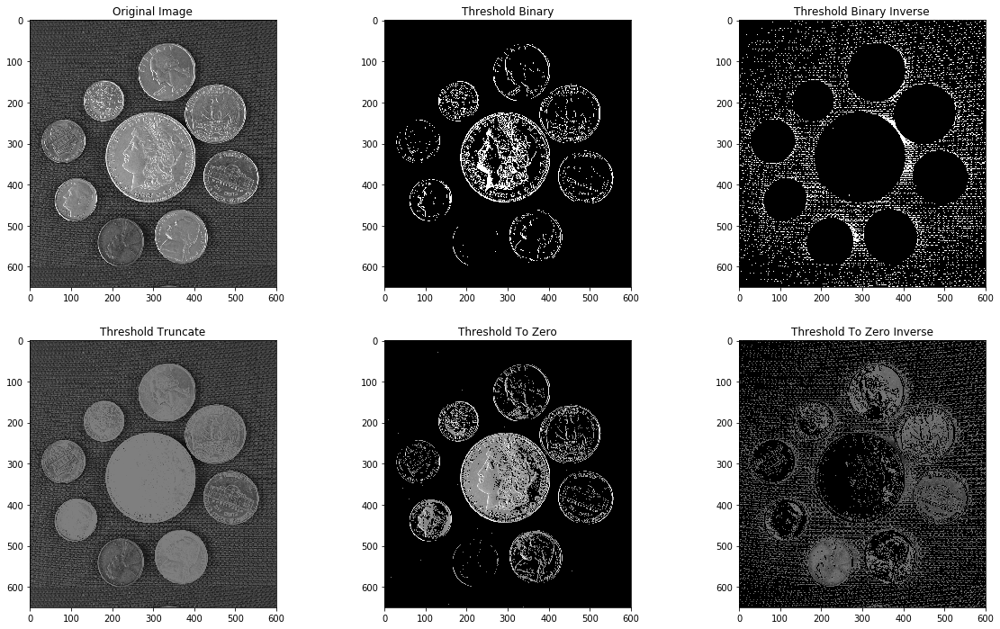

In [8]:
###
th1, dst_bin = cv2.threshold(imageGray, 150, 255, cv2.THRESH_BINARY) # Tried multiple values here
th2, dst_bin_inv = cv2.threshold(imageGray, 35, 255, cv2.THRESH_BINARY_INV) # Tried multiple values here
th3, dst_trunc = cv2.threshold(imageGray, 127, 255, cv2.THRESH_TRUNC) # did not seem like they would come close to author's solution
th4, dst_to_zero = cv2.threshold(imageGray, 127, 255, cv2.THRESH_TOZERO) # did not seem like they would come close to author's solution
th5, dst_to_zero_inv = cv2.threshold(imageR, 120, 255, cv2.THRESH_TOZERO_INV) # Tried multiple values here

plt.figure(figsize=[20,12])
plt.subplot(231);plt.imshow(imageGray, cmap='gray', vmin=0, vmax=255);plt.title("Original Image");
plt.subplot(232);plt.imshow(dst_bin, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary");
plt.subplot(233);plt.imshow(dst_bin_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary Inverse");
plt.subplot(234);plt.imshow(dst_trunc, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Truncate");
plt.subplot(235);plt.imshow(dst_to_zero, cmap='gray', vmin=0, vmax=255);plt.title("Threshold To Zero");
plt.subplot(236);plt.imshow(dst_to_zero_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold To Zero Inverse");

###


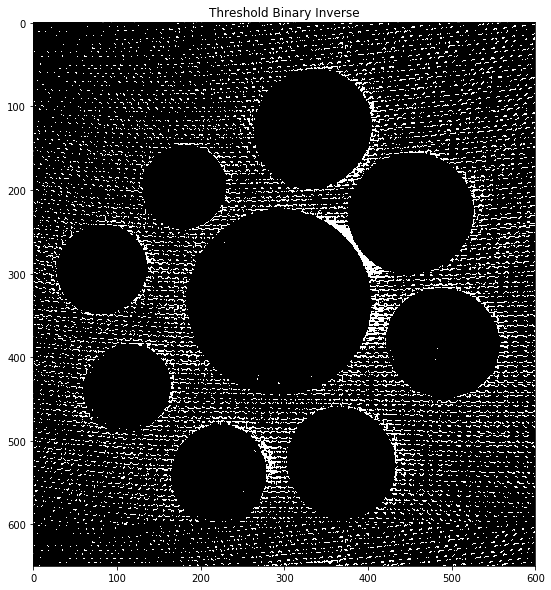

In [9]:
# Display the thresholded image
###
plt.imshow(dst_bin_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary Inverse"); # Final Solution
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

Text(0.5,1,'With Kernel (7,7) and Ellipse')

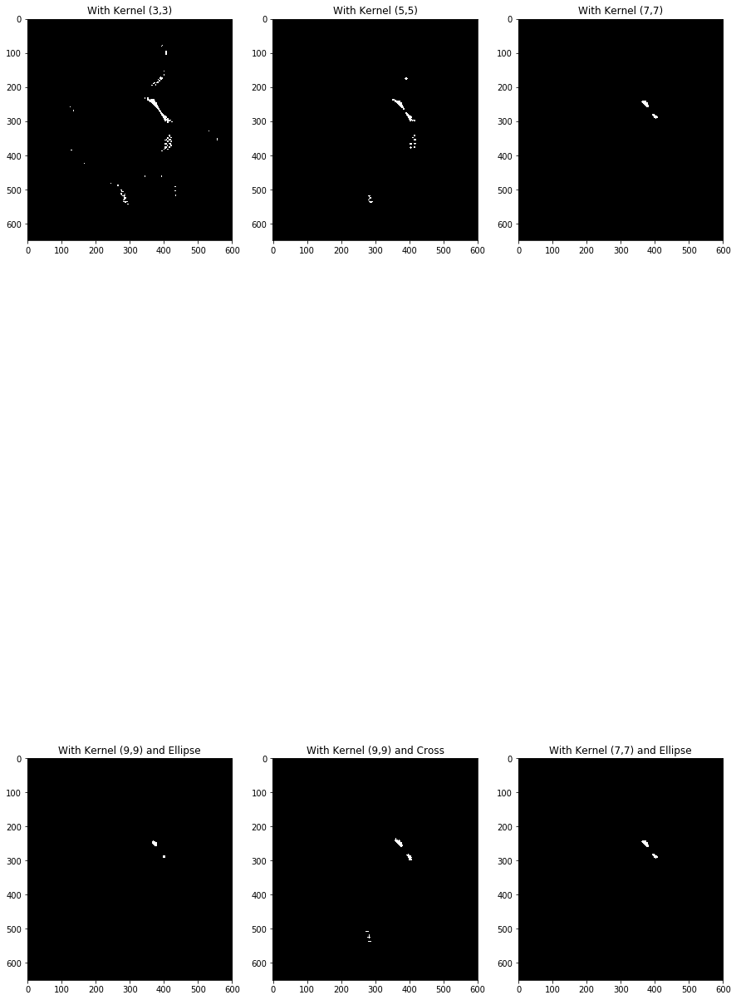

In [10]:
###
ksize1, ksize2, ksize3, ksize4 = (3,3), (5,5), (7,7), (9,9)
element1 = cv2.getStructuringElement(cv2.MORPH_RECT, ksize1)
element2 = cv2.getStructuringElement(cv2.MORPH_OPEN, ksize2)
element3 = cv2.getStructuringElement(cv2.MORPH_OPEN, ksize3)
element4 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize4)
element5 = cv2.getStructuringElement(cv2.MORPH_CROSS, ksize4)
element6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize3)

plt.figure(figsize=[15,30])

im1 = dst_bin_inv.copy()
plt.subplot(231);plt.imshow(cv2.morphologyEx(im1, cv2.MORPH_OPEN, element1), cmap="gray");plt.title("With Kernel (3,3)")
im2 = dst_bin_inv.copy()
plt.subplot(232);plt.imshow(cv2.morphologyEx(im2, cv2.MORPH_OPEN, element2), cmap="gray");plt.title("With Kernel (5,5)")
im3 = dst_bin_inv.copy()
plt.subplot(233);plt.imshow(cv2.morphologyEx(im3, cv2.MORPH_OPEN, element3), cmap="gray");plt.title("With Kernel (7,7)")
im4 = dst_bin_inv.copy()
plt.subplot(234);plt.imshow(cv2.morphologyEx(im4, cv2.MORPH_OPEN, element4), cmap="gray");plt.title("With Kernel (9,9) and Ellipse")
im5 = dst_bin_inv.copy()
plt.subplot(235);plt.imshow(cv2.morphologyEx(im5, cv2.MORPH_OPEN, element5), cmap="gray");plt.title("With Kernel (9,9) and Cross")
im6 = dst_bin_inv.copy()
plt.subplot(236);plt.imshow(cv2.morphologyEx(im6, cv2.MORPH_OPEN, element6), cmap="gray");plt.title("With Kernel (7,7) and Ellipse")
###


Text(0.5,1,'After 2 ersions')

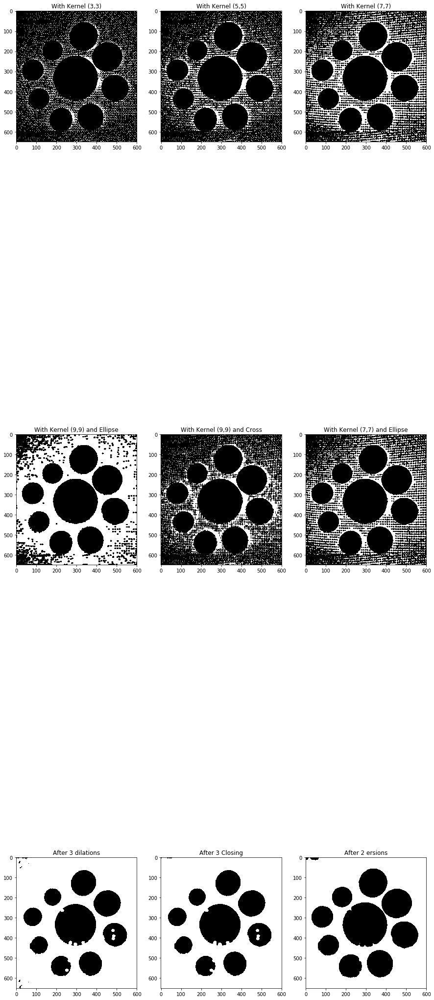

In [11]:
###
ksize1, ksize2, ksize3, ksize4, ksize5 = (3,3), (5,5), (7,7), (9,9), (11,11)
element1 = cv2.getStructuringElement(cv2.MORPH_RECT, ksize1)
element2 = cv2.getStructuringElement(cv2.MORPH_OPEN, ksize2)
element3 = cv2.getStructuringElement(cv2.MORPH_OPEN, ksize3)
element4 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize4)
element5 = cv2.getStructuringElement(cv2.MORPH_CROSS, ksize4)
element6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize3)
element7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize5)
ksize6 = (13,13)
element8 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize6)

plt.figure(figsize=[15,45])

im1 = dst_bin_inv.copy()
plt.subplot(331);plt.imshow(cv2.morphologyEx(im1, cv2.MORPH_CLOSE, element1), cmap="gray");plt.title("With Kernel (3,3)")
im2 = dst_bin_inv.copy()
plt.subplot(332);plt.imshow(cv2.morphologyEx(im2, cv2.MORPH_CLOSE, element2), cmap="gray");plt.title("With Kernel (5,5)")
im3 = dst_bin_inv.copy()
plt.subplot(333);plt.imshow(cv2.morphologyEx(im3, cv2.MORPH_CLOSE, element3), cmap="gray");plt.title("With Kernel (7,7)")
im4 = dst_bin_inv.copy()
plt.subplot(334);plt.imshow(cv2.morphologyEx(im4, cv2.MORPH_CLOSE, element4), cmap="gray");plt.title("With Kernel (9,9) and Ellipse")
im5 = dst_bin_inv.copy()
plt.subplot(335);plt.imshow(cv2.morphologyEx(im5, cv2.MORPH_CLOSE, element5), cmap="gray");plt.title("With Kernel (9,9) and Cross")
im6 = dst_bin_inv.copy()
plt.subplot(336);plt.imshow(cv2.morphologyEx(im6, cv2.MORPH_CLOSE, element6), cmap="gray");plt.title("With Kernel (7,7) and Ellipse")

im7 = dst_bin_inv.copy()

img = im7.copy()

for i in range(2):
    img = cv2.dilate(img, element4)

plt.subplot(337);plt.imshow(img);plt.title("After 3 dilations")

img1 = img.copy()

for i in range(3):
    img1 = cv2.morphologyEx(img1, cv2.MORPH_CLOSE, element4)

plt.subplot(338);plt.imshow(img1);plt.title("After 3 Closing")

img2 = img1.copy()

for i in range(2):
    img2 = cv2.erode(img2, element4)

plt.subplot(339);plt.imshow(img2);plt.title("After 2 ersions")

# im8 = dst_bin_inv.copy()
# plt.subplot(338);plt.imshow(cv2.dilate(im8, element7));plt.title("Dilation with (11,11)")
# im9 = dst_bin_inv.copy()
# plt.subplot(339);plt.imshow(cv2.dilate(im9, element8));plt.title("Dilation with (13,13)")



###


Text(0.5,1,'Final Dilated Image after lot of experiments')

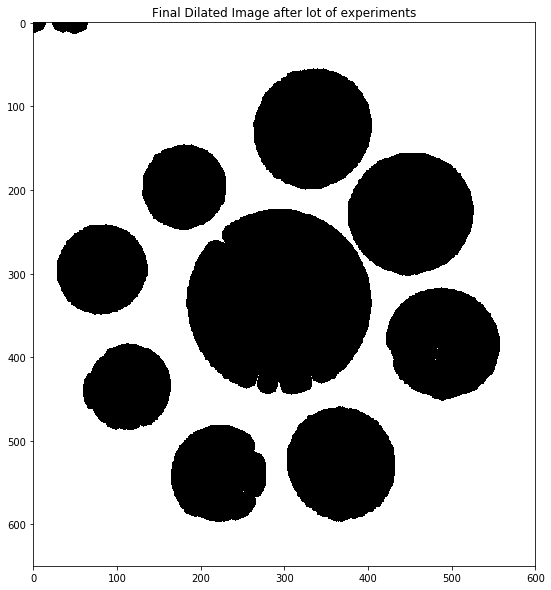

In [12]:
# Display all the images
# you have obtained in the intermediate steps
###
plt.imshow(img2);plt.title("Final Dilated Image after lot of experiments")
###


In [13]:
# Get structuring element/kernel which will be used for dilation
###
ksize4 = (7,7)
element4 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize4)
###


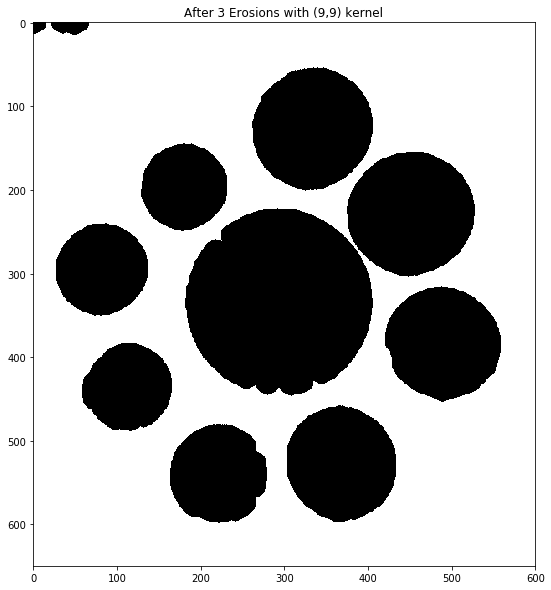

In [14]:
###
img2 = img1.copy()

for i in range(3):
    img2 = cv2.erode(img2, element4)

plt.imshow(img2);plt.title("After 3 Erosions with (9,9) kernel")

finalImage = img2.copy()

###


Text(0.5,1,'After lot of experiments')

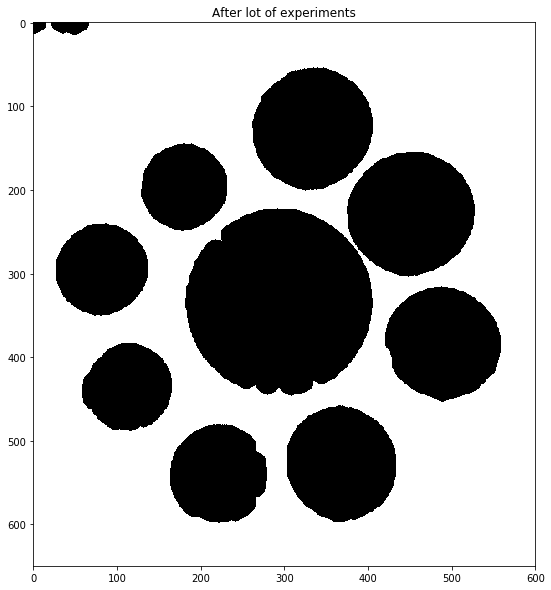

In [15]:
###
plt.imshow(finalImage);plt.title("After lot of experiments")
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [16]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [17]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [18]:
# Detect blobs
###
keypoints = detector.detect(finalImage)
###


In [19]:
# Print number of coins detected
###
print(len(keypoints))
###


9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [20]:
# Mark coins using image annotation concepts we have studied so far
###
imgCopy = image.copy()
for k in keypoints:
    x,y = k.pt
    x,y = int(round(x)), int(round(y))

    cv2.circle(imgCopy, (x,y), 3, (255,0,0), -1, cv2.LINE_AA)

    diameter = k.size
    radius = int(round(diameter/2))
    cv2.circle(imgCopy, (x,y), radius, (0,255,0), 2,cv2.LINE_AA)
###


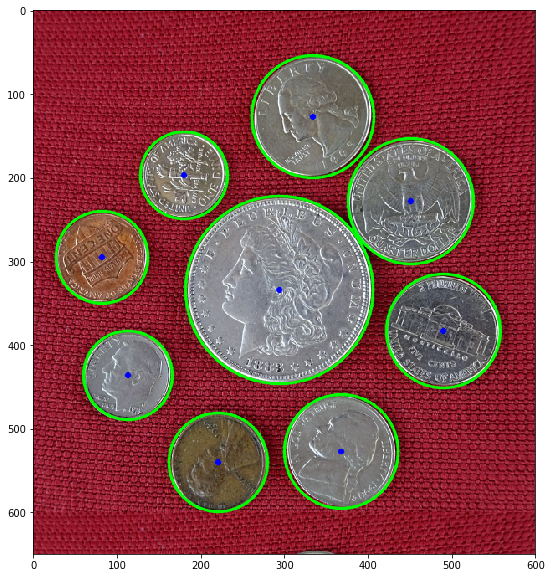

In [21]:
# Display the final image
###
plt.imshow(imgCopy[...,::-1], cmap="gray")
###


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [22]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [23]:
# Find connected components
###
_, imgLabels = cv2.connectedComponents(finalImage)
###


650


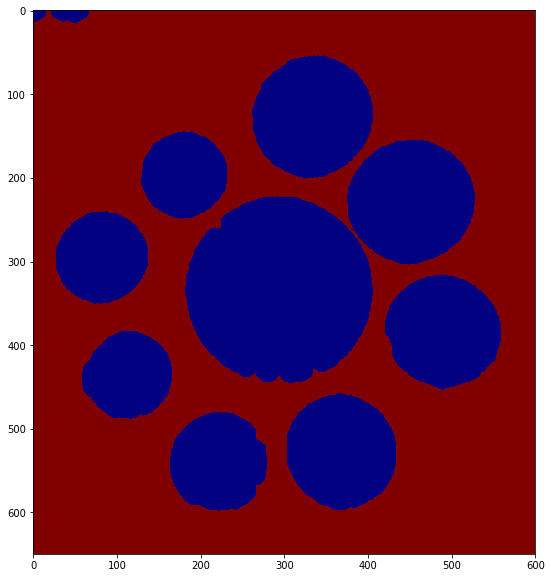

In [24]:
# Print number of connected components detected
###
print(len(imgLabels))
displayConnectedComponents(imgLabels)
###


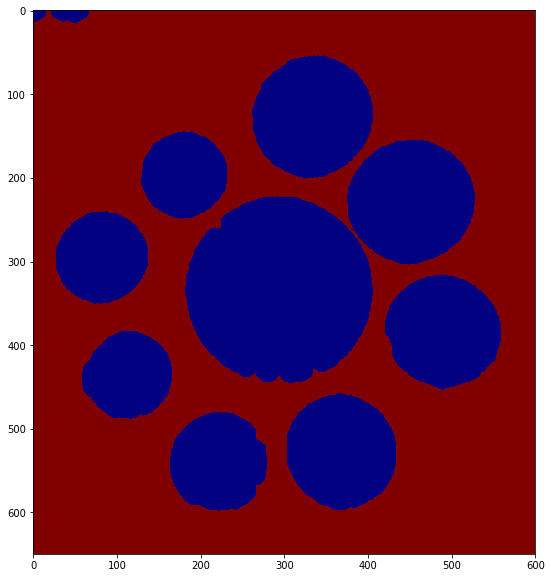

In [25]:
# Display connected components using displayConnectedComponents
# function
###
displayConnectedComponents(imgLabels)
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [51]:
# Find all contours in the image
###
contour, heirarchy = cv2.findContours(finalImage, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
###


In [52]:
# Print the number of contours found
###
print(f'Number of contours found = {len(contour)}')
###


Number of contours found = 10


Text(0.5,1,'All Contours')

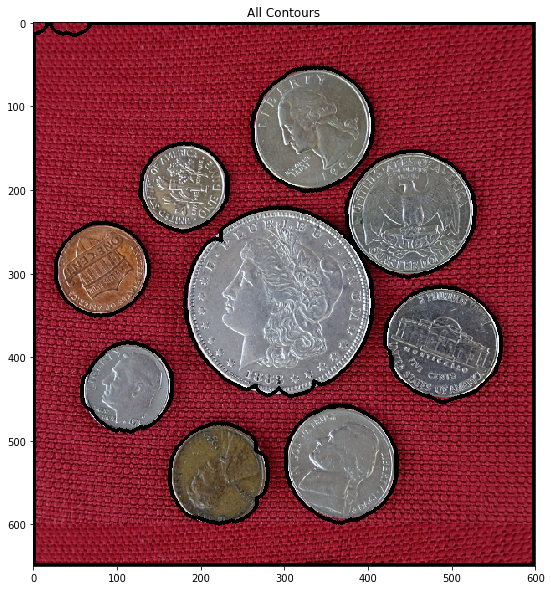

In [56]:
# Draw all contours
###
img = image.copy()
cv2.drawContours(img, contour, -1, (0,0,0), 3)
plt.imshow(img[...,::-1]);plt.title("All Contours")
###


Let's only consider the outer contours.

Number of contours found = 54


Text(0.5,1,'External Contour')

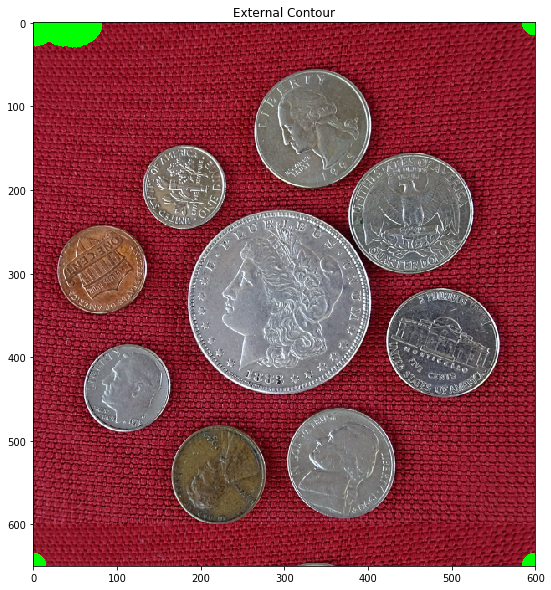

In [57]:
# Remove the inner contours
# Display the result
###
outerContour = contour[9]
print(f'Number of contours found = {len(outerContour)}')
imageCopy2 = image.copy()
cv2.drawContours(imageCopy2, outerContour, -1, (0,255,0), 30);
plt.imshow(imageCopy2[...,::-1]);plt.title("External Contour")
###


So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [59]:
# Print area and perimeter of all contours
###
for idx, i in enumerate(contour):
    area = cv2.contourArea(i)
    perimeter = cv2.arcLength(i, True)
    print(f'Area of contour {idx+1} is {area}, and the perimeter is {perimeter}')
###


Area of contour 1 is 10958.5, and the perimeter is 406.2325361967087
Area of contour 2 is 14396.5, and the perimeter is 456.6589426994324
Area of contour 3 is 8747.5, and the perimeter is 356.23253667354584
Area of contour 4 is 14607.5, and the perimeter is 457.8305164575577
Area of contour 5 is 9593.0, and the perimeter is 369.9898957014084
Area of contour 6 is 39065.0, and the perimeter is 780.4650725126266
Area of contour 7 is 17820.5, and the perimeter is 503.28635931015015
Area of contour 8 is 8449.5, and the perimeter is 346.4335466623306
Area of contour 9 is 16583.0, and the perimeter is 492.70057213306427
Area of contour 10 is 388042.5, and the perimeter is 2510.6690467596054


In [62]:
# Print maximum area of contour
# This will be the box that we want to remove
###
maximumArea = 0
saveIdx = -1
for idx, i in enumerate(contour):
    area = cv2.contourArea(i)
    perimeter = cv2.arcLength(i, True)
    if area > maximumArea:
        maximumArea = area
        saveIdx = idx
print(f'Maximum area of contour = {area} and the index is {idx}')
###


Maximum area of contour = 388042.5 and the index is 9


Text(0.5,1,'All Contours')

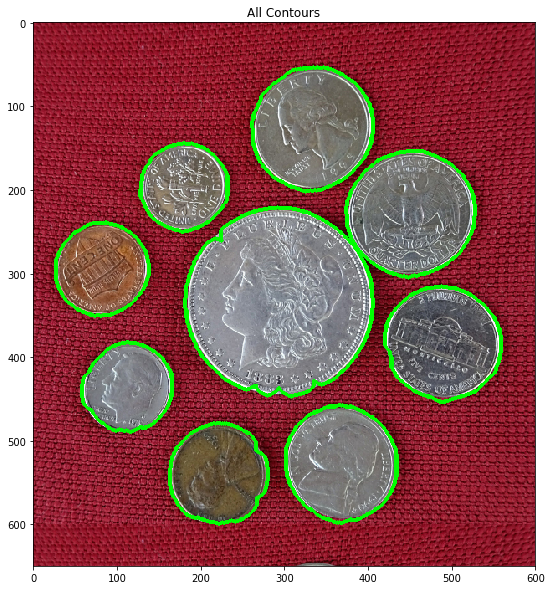

In [64]:
# Remove this contour and plot others
###
imageCopy3 = image.copy()
contour = contour[:saveIdx]
cv2.drawContours(imageCopy3, contour, -1, (0,255,0), 3)
plt.imshow(imageCopy3[...,::-1]);plt.title("All Contours")
###


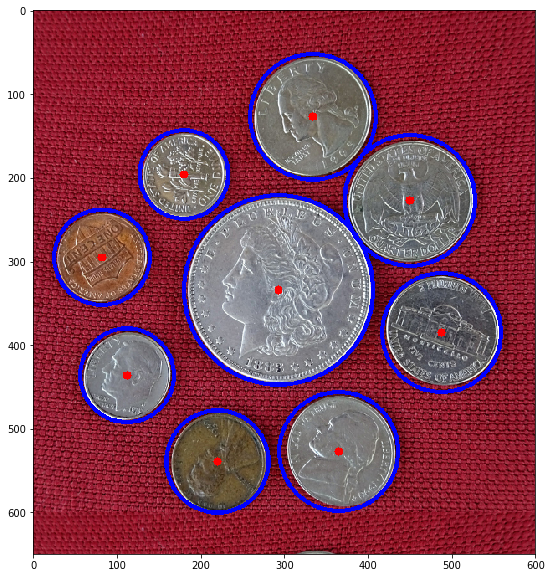

In [70]:
# Fit circles on coins
###
imageCopy4 = image.copy()
for i in contour:
    ((x,y), radius) = cv2.minEnclosingCircle(i)
    cv2.circle(imageCopy4, (int(x), int(y)), int(round(radius)), (255,0,0), 3)
    cv2.circle(imageCopy4, (int(x), int(y)), 5, (0,0,255), -1)
    
plt.imshow(imageCopy4[...,::-1])
###


# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

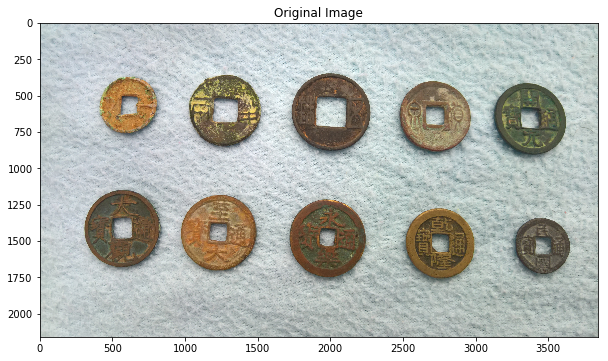

In [4]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
###
image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
###
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [5]:
# Convert to grayscale
# Store in variable imageGray
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
###


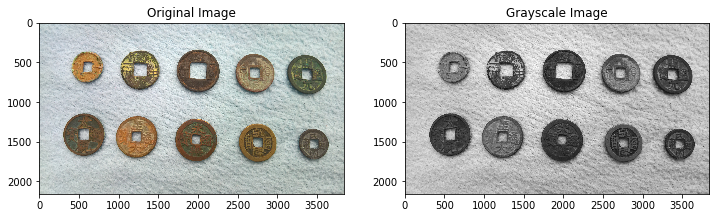

In [6]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [7]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
imageB, imageG, imageR = image[:,:,0], image[:,:,1], image[:,:,2]
###


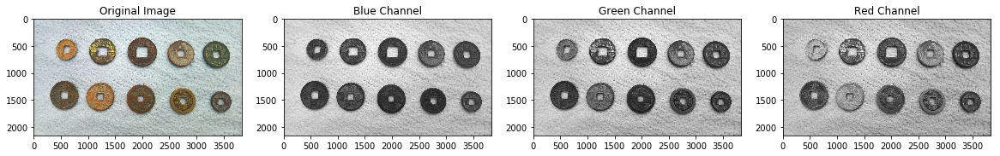

In [8]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

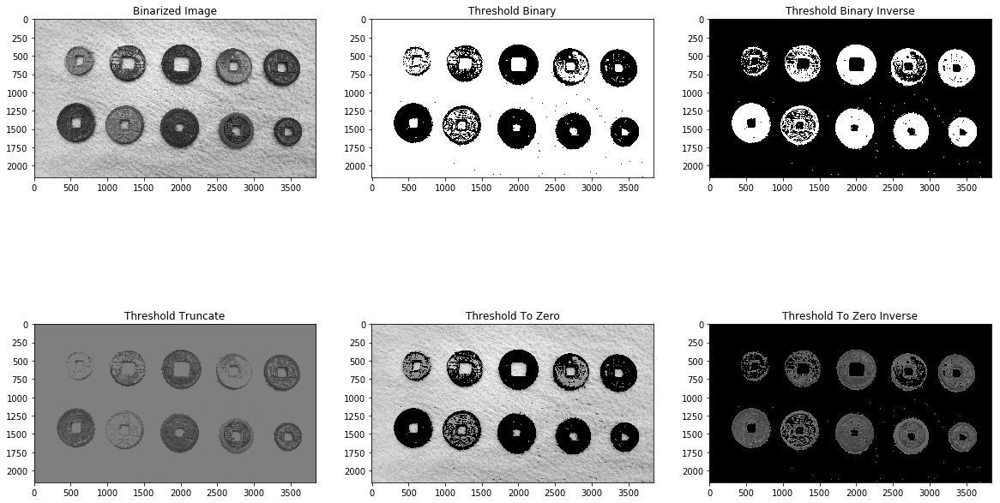

In [9]:
###
src = imageGray.copy()
th, dst_bin = cv2.threshold(src, 127, 255, cv2.THRESH_BINARY)
th, dst_bin_inv = cv2.threshold(src, 127, 255, cv2.THRESH_BINARY_INV)
th, dst_trunc = cv2.threshold(src, 127, 255, cv2.THRESH_TRUNC)
th, dst_to_zero = cv2.threshold(src, 127, 255, cv2.THRESH_TOZERO)
th, dst_to_zero_inv = cv2.threshold(src, 127, 255, cv2.THRESH_TOZERO_INV)

plt.figure(figsize=[20,12])
plt.subplot(231);plt.imshow(src, cmap='gray');plt.title("Binarized Image")
plt.subplot(232);plt.imshow(dst_bin, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary");
plt.subplot(233);plt.imshow(dst_bin_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary Inverse");
plt.subplot(234);plt.imshow(dst_trunc, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Truncate");
plt.subplot(235);plt.imshow(dst_to_zero, cmap='gray', vmin=0, vmax=255);plt.title("Threshold To Zero");
plt.subplot(236);plt.imshow(dst_to_zero_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold To Zero Inverse");
###


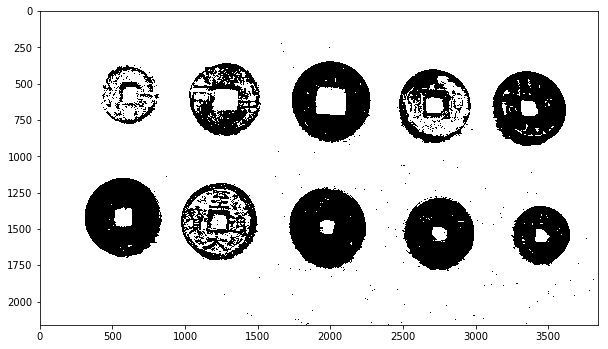

In [10]:
# Display image using matplotlib
###
th, dst_bin = cv2.threshold(src, 127, 255, cv2.THRESH_BINARY)
plt.imshow(dst_bin)
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [11]:
###
ksize = (9,9)
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
###


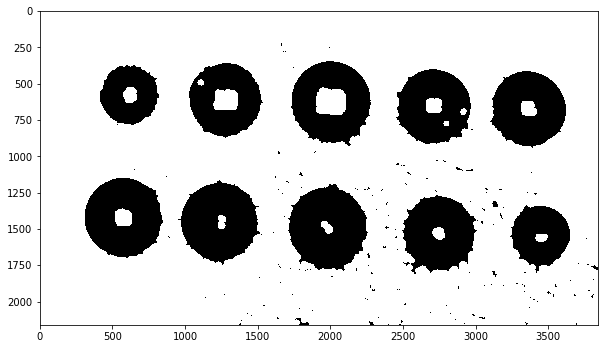

In [12]:
###
img = dst_bin.copy()
openedImage = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel1, iterations=5)
plt.imshow(openedImage, cmap="gray")
###


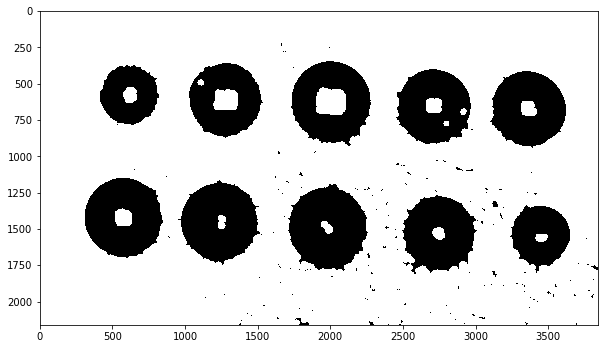

In [13]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1, iterations=5)
plt.imshow(openedImage, cmap="gray")
###


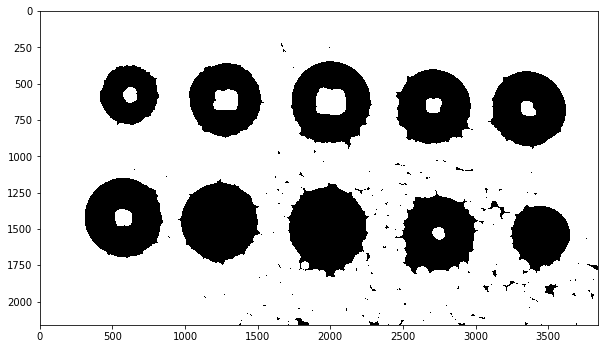

In [14]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1, iterations=7)
plt.imshow(openedImage, cmap="gray")
###


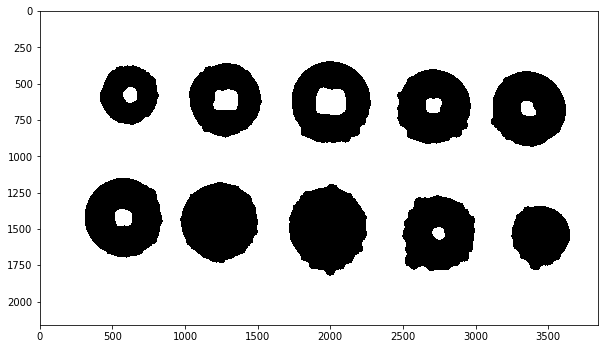

In [15]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1, iterations=7)
plt.imshow(openedImage, cmap="gray")
###


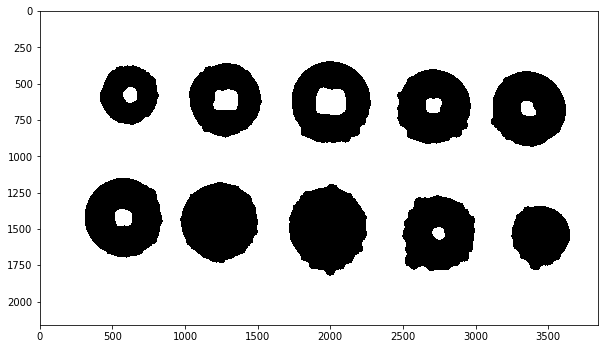

In [16]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1, iterations=7)
plt.imshow(openedImage, cmap="gray")
###


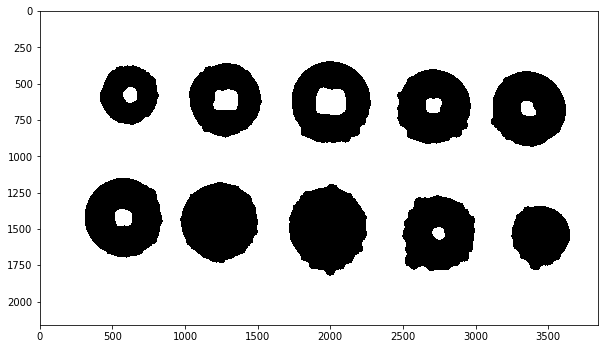

In [17]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1, iterations=5)
plt.imshow(openedImage, cmap="gray")
###


Text(0.5,1,'Image after closing and then opening')

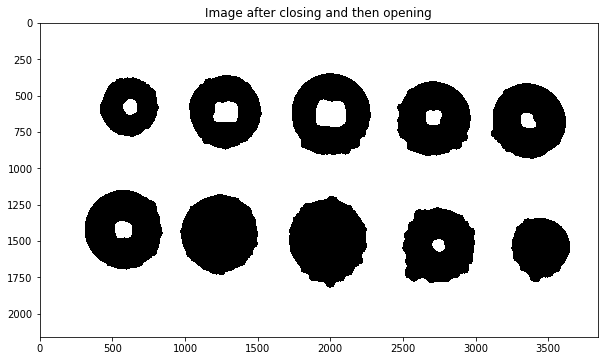

In [18]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1, iterations=7)
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1, iterations=7)
plt.imshow(openedImage, cmap="gray");plt.title("Image after closing and then opening")
###


Text(0.5,1,'Image after closing and opening')

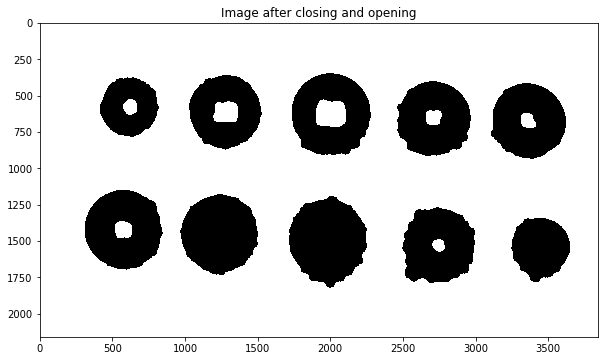

In [19]:
###
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1)
openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1)
plt.imshow(openedImage, cmap="gray");plt.title("Image after closing and opening")
###


Text(0.5,1,'Image after closing and opening')

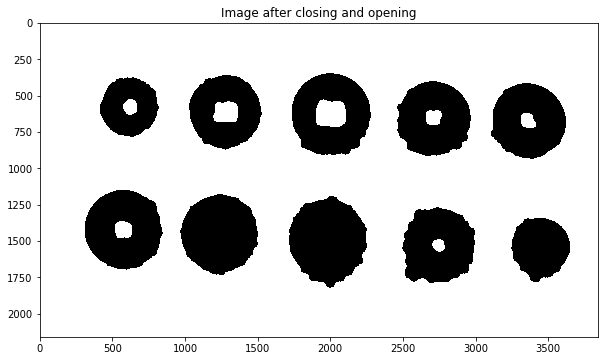

In [20]:
###
for i in range(5):
    openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1)
    openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1)

plt.imshow(openedImage, cmap='gray');plt.title("Image after closing and opening")
###


Text(0.5,1,'Image after closing and opening')

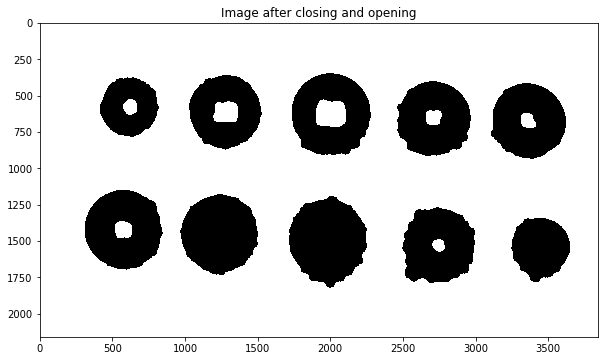

In [21]:
###
for i in range(10):
    openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_CLOSE, kernel1)
    openedImage = cv2.morphologyEx(openedImage, cv2.MORPH_OPEN, kernel1)

plt.imshow(openedImage, cmap='gray');plt.title("Image after closing and opening")
###


Text(0.5,1,'after 10 iterations')

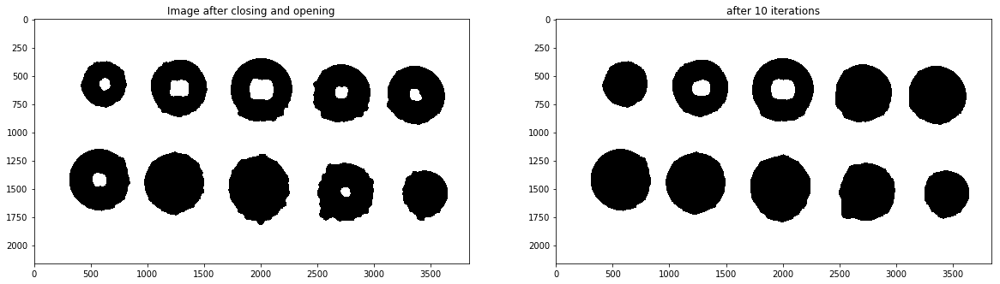

In [22]:
###
openImg = openedImage.copy()

for i in range(10):
    openImg = cv2.morphologyEx(openImg, cv2.MORPH_CLOSE, kernel1, iterations=15)
    openImg = cv2.morphologyEx(openImg, cv2.MORPH_OPEN, kernel1, iterations=15)
    
    openImg = cv2.morphologyEx(openImg, cv2.MORPH_CLOSE, kernel1, iterations=15)
    openImg = cv2.morphologyEx(openImg, cv2.MORPH_OPEN, kernel1, iterations=15)

plt.figure(figsize=[20,15])
plt.subplot(121);plt.imshow(openedImage, cmap='gray');plt.title("Image after closing and opening")
plt.subplot(122);plt.imshow(openImg, cmap='gray');plt.title("after 10 iterations")
###


Text(0.5,1,'after 10 iterations')

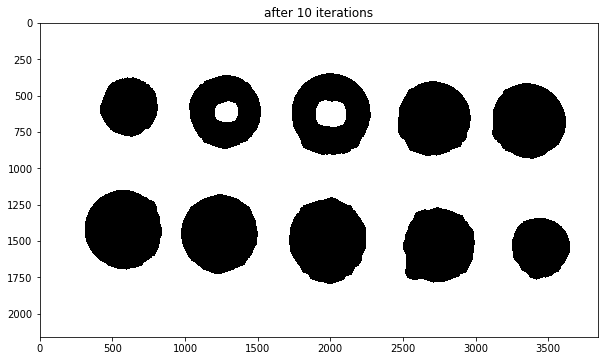

In [23]:
###
plt.imshow(openImg, cmap='gray');plt.title("after 10 iterations")
###


Text(0.5,1,'Image after closing and then opening')

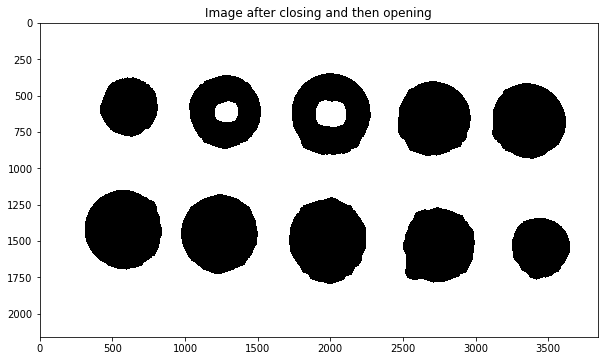

In [24]:
###
openImg = cv2.morphologyEx(openImg, cv2.MORPH_CLOSE, kernel1, iterations=15)
openImg = cv2.morphologyEx(openImg, cv2.MORPH_OPEN, kernel1, iterations=15)

plt.imshow(openImg, cmap='gray');plt.title("Image after closing and then opening")
###


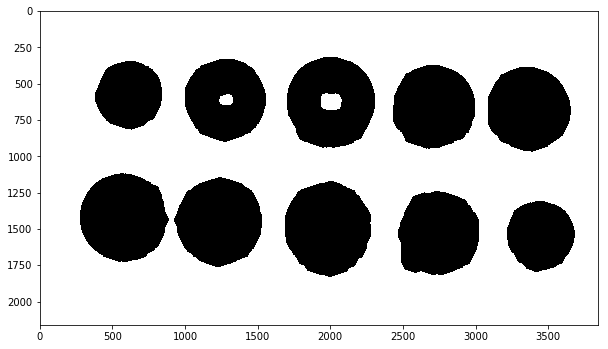

In [68]:
###
imgEx = openImg.copy()

imgEx = cv2.morphologyEx(imgEx, cv2.MORPH_CLOSE, kernel1, iterations=16)
imgEx = cv2.morphologyEx(imgEx, cv2.MORPH_OPEN, kernel1, iterations=17)

imgEx = cv2.erode(imgEx, kernel1, iterations=8)
plt.imshow(imgEx, cmap='gray')
###


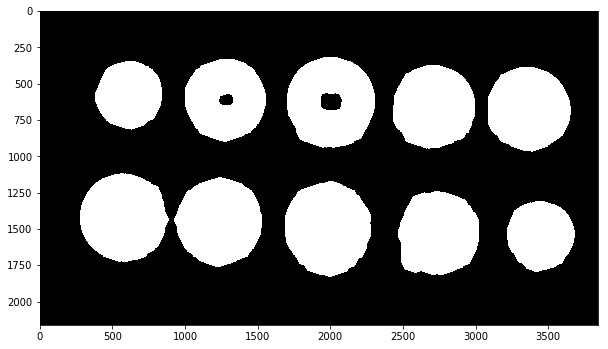

In [69]:
###
_, imgInverse = cv2.threshold(imgEx, 127,255,cv2.THRESH_BINARY_INV)
plt.imshow(imgInverse)
###


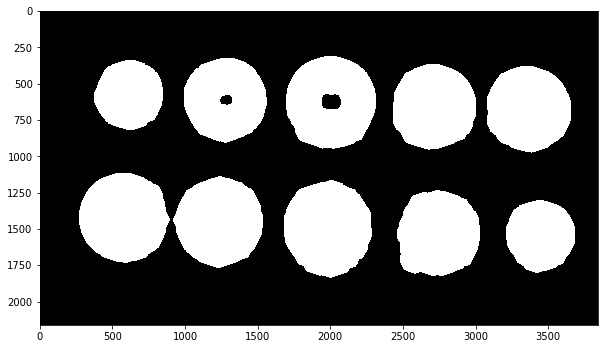

In [70]:
###
kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
imgInverse = cv2.dilate(imgInverse, kernel2, iterations=3)
plt.imshow(imgInverse)
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [72]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [73]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [75]:
# Detect blobs
###
keypoints = detector.detect(imgEx)
print(f'Number of coins detected = {len(keypoints)}')
###


Number of coins detected = 8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

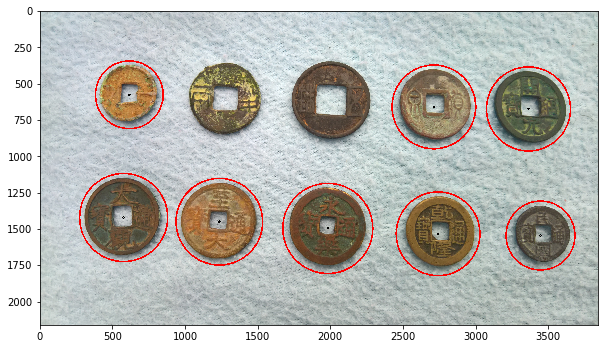

In [79]:
###
imgOG = image.copy()
for k in keypoints:
    x,y = k.pt
    x,y = int(round(x)), int(round(y))
    
    cv2.circle(imgOG, (x,y), 5, (0,0,0), 5)
    
    diameter = k.size
    radius = int(round(diameter/2))
    cv2.circle(imgOG, (x,y), radius, (0,0,255), 10)
    
    plt.imshow(imgOG[...,::-1])
###


In [58]:
###
### YOUR CODE HERE
###


Text(0.5,1,'Final Image')

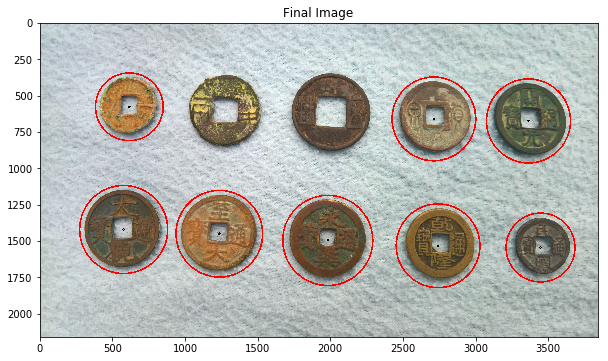

In [80]:
###
plt.imshow(imgOG[...,::-1]);plt.title("Final Image")
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [81]:
###
_, imLabels = cv2.connectedComponents(imgEx)
###


In [84]:
###
print(f'Number of connected components detected = {len(imLabels)}')
###


Number of connected components detected = 2160


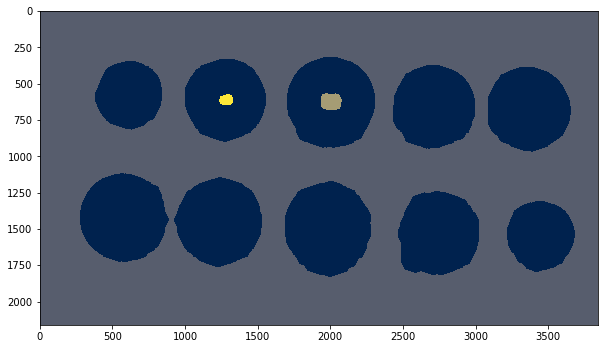

In [85]:
###
(minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)

imLabels = 255 * (imLabels - minVal)/(maxVal - minVal)

imLabels = np.uint8(imLabels)

imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_CIVIDIS)
plt.imshow(imColorMap[:,:,::-1])
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [88]:
# Find all contours in the image
###
contours, _ = cv2.findContours(imgEx, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
###


In [89]:
# Print the number of contours found
###
print(f'Number of contours found = {len(contours)}')
###


Number of contours found = 13


Text(0.5,1,'Plotting all contours')

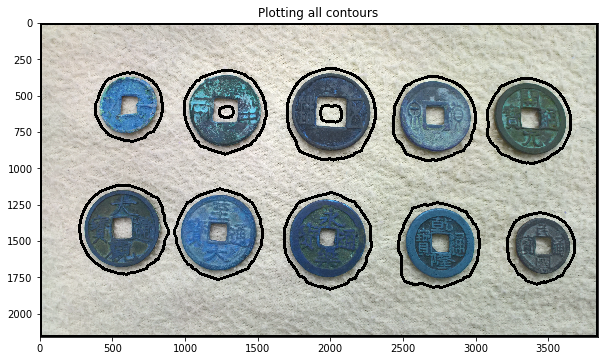

In [99]:
# Draw all contours
###
imgOG = image.copy()
cv2.drawContours(imgOG, contours, -1, (0,0,0), 20)
plt.imshow(imgOG);plt.title("Plotting all contours")


# Not sure how/why the original Image changed its color,
# would appreciate your feedback

###


Text(0.5,1,'Plotting all contours')

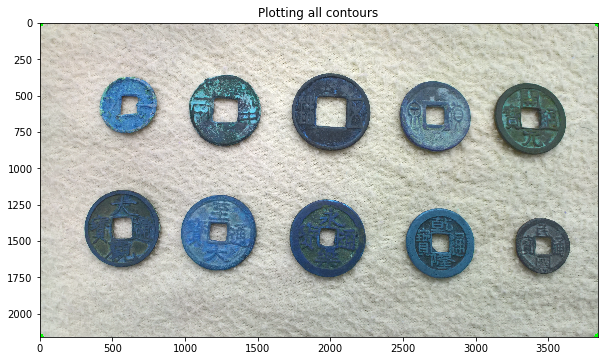

In [102]:
# Remove the inner contours
# Display the result
###
imgOG = image.copy()
cv2.drawContours(imgOG, contours[12], -1, (0,255,0), 50)
plt.imshow(imgOG);plt.title("Plotting all contours")

# This is another problem I faced in both the sections, for some reason it,
# it does not draw the entire outer contour, just four corners 
# but in the above picture it shows all conoturs correctly.
# Not sure why, would appreciate your comments on this as well
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [100]:
# Print area and perimeter of all contours
###
for idx, i in enumerate(contours):
    area = cv2.contourArea(i)
    perimeter = cv2.arcLength(i, True)
    print(f'contour {idx+1} has area = {area}, and perimeter = {perimeter}')
###


contour 1 has area = 175868.5, and perimeter = 1625.0062654018402
contour 2 has area = 262599.0, and perimeter = 2018.4448623657227
contour 3 has area = 302883.0, and perimeter = 2155.5819454193115
contour 4 has area = 282230.0, and perimeter = 2065.322059035301
contour 5 has area = 287995.0, and perimeter = 2070.635768532753
contour 6 has area = 5983.5, and perimeter = 303.37972366809845
contour 7 has area = 14149.5, and perimeter = 469.3208485841751
contour 8 has area = 262796.0, and perimeter = 1966.1261013746262
contour 9 has area = 260002.0, and perimeter = 1963.5575585365295
contour 10 has area = 169529.0, and perimeter = 1608.0773310661316
contour 11 has area = 249195.0, and perimeter = 1932.5281215906143
contour 12 has area = 303232.5, and perimeter = 2114.9372823238373
contour 13 has area = 8288401.0, and perimeter = 11996.0


In [103]:
# Print maximum area of contour
# This will be the box that we want to remove
###
maximumArea = 0
for idx, i in enumerate(contours):
    area = cv2.contourArea(i)
    perimeter = cv2.arcLength(i, True)
    if area > maximumArea:
        maximumArea = area

print(f'Maximum area of contour = {maximumArea}')
###


Maximum area of contour = 8288401.0


Text(0.5,1,'Plotting all contours')

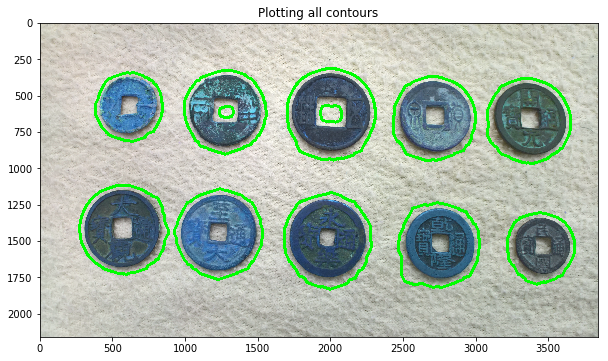

In [104]:
# Remove this contour and plot others
###
imgOG = image.copy()
cv2.drawContours(imgOG, contours[:12], -1, (0,255,0), 20)
plt.imshow(imgOG);plt.title("Plotting all contours")
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [106]:
# Print sorted area of contours
###
area = []
for idx, i in enumerate(contours):
    area.append((cv2.contourArea(i), idx))

area.sort()
print(area)
    
###


[(5983.5, 5), (14149.5, 6), (169529.0, 9), (175868.5, 0), (249195.0, 10), (260002.0, 8), (262599.0, 1), (262796.0, 7), (282230.0, 3), (287995.0, 4), (302883.0, 2), (303232.5, 11), (8288401.0, 12)]


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours = 10


Text(0.5,1,'Plotting contours')

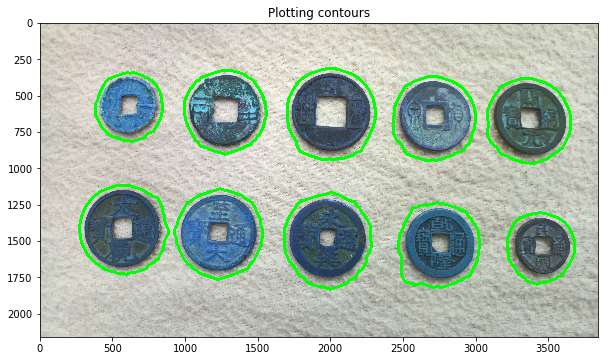

In [111]:
# Remove the 2 inner contours
# Plot the rest of them
###
contoursCopy = contours.copy()
contoursCopy.pop(5)
contoursCopy.pop(5)
contoursCopy.pop(-1) # removed outer contour here, the biggest one

print(f'Number of contours = {len(contoursCopy)}')

imgOG = image.copy()
cv2.drawContours(imgOG, contoursCopy, -1, (0,255,0), 20)
plt.imshow(imgOG);plt.title("Plotting contours")
###


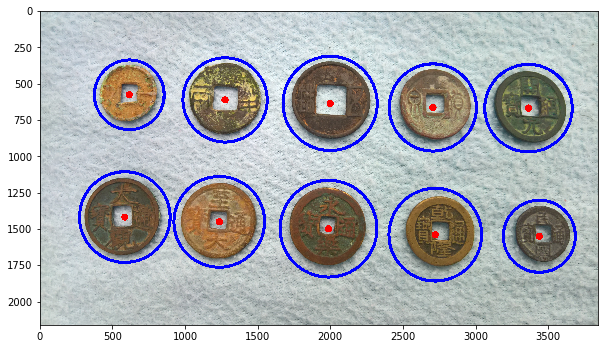

In [114]:
# Fit circles on coins
###
finalImage = image.copy()
for i in contoursCopy:
    ((x,y), radius) = cv2.minEnclosingCircle(i)
    cv2.circle(finalImage, (int(x), int(y)), int(round(radius)), (255,0,0), 20)
    cv2.circle(finalImage, (int(x), int(y)), 25, (0,0,255), -1)
    
plt.imshow(finalImage[...,::-1])
###
